In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import time
import datetime
import seaborn as sns

import statsmodels.stats.diagnostic as dg
import statsmodels.tools.tools as ct
import statsmodels.regression.linear_model as rg
from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm
# from pandas.tools.plotting import autocorrelation_plot
import xgboost as xgb
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [40]:
def parser(x):
    return datetime.datetime.strptime(x,'%Y-%m-%d')

In [41]:
START_DATE = "2013-01-02"
END_DATE = "2021-12-31"
SPLIT_FACTOR = 0.8

In [69]:
raw_data = pd.read_csv(r'data\dataset_9.csv', header=0, sep = ";", parse_dates=[0], date_parser=parser)
mask = (raw_data['Date'] >= START_DATE) & (raw_data['Date'] <= END_DATE)
stock_df = raw_data.loc[mask]
stock_df.reset_index(inplace = True, drop = True)
stock_df

,Date,^GSPC,^DJI,^IXIC,^NYA,^VIX,000001.SS,EURUSD=X,JPY=X,GBPUSD=X,...,MRK,LLY,MCD,T,NKE,DHR,LOW,LIN,TXN,NEE
0,2013-01-02,1462.420044,13412.54980,3112.260010,8632.009766,14.680000,2269.127930,1.319784,86.599998,1.624695,...,29.634867,39.079025,69.449501,20.130396,22.521328,28.374767,30.915403,93.433762,25.615805,13.006111
1,2013-01-03,1459.369995,13391.36035,3100.570068,8607.790039,14.560000,2269.127930,1.318218,87.275002,1.625250,...,30.344551,39.244770,69.842514,20.141891,22.751579,28.646267,30.624966,93.433762,25.282818,13.007962
2,2013-01-04,1466.469971,13435.20996,3101.659912,8667.679688,13.830000,2276.991943,1.303271,87.739998,1.608234,...,30.086483,40.697124,69.241432,20.262678,22.973143,28.675886,30.394314,94.064522,25.227316,13.072507
3,2013-01-07,1461.890015,13384.29004,3098.810059,8636.910156,13.790000,2285.364014,1.306745,88.197998,1.606787,...,30.194008,40.641869,70.058296,20.354708,23.007896,28.675886,29.693823,93.857025,25.306608,13.011653
4,2013-01-08,1457.150024,13328.84961,3091.810059,8604.379883,13.620000,2276.070068,1.312508,87.252998,1.612201,...,30.237034,40.949703,70.081436,20.010992,22.764624,28.473501,29.710911,94.512688,25.013260,13.149972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,4791.189941,36302.37891,15871.259770,17141.089840,17.680000,3615.969971,1.132426,114.333000,1.340430,...,76.570000,278.410004,268.239990,24.286488,167.580002,327.197418,252.866135,343.420013,191.839996,91.320000
2263,2021-12-28,4786.350098,36398.21094,15781.719730,17134.160160,17.540001,3630.112061,1.133003,114.792000,1.344267,...,76.809998,276.429993,267.880005,24.325691,166.419998,323.230011,253.185089,343.790008,191.100006,91.879997
2264,2021-12-29,4793.060059,36488.62891,15766.219730,17149.929690,16.950001,3597.000000,1.131478,114.773003,1.343328,...,76.949997,278.420013,268.489990,24.149275,168.779999,326.579987,256.723419,345.399994,190.809998,91.989998
2265,2021-12-30,4778.729980,36398.07813,15741.559570,17164.240230,17.330000,3619.189941,1.136015,114.947998,1.349879,...,77.139999,277.250000,267.209992,24.286488,167.490005,328.470001,255.547317,344.329987,189.410004,92.769997


In [70]:
stock_df.dtypes

Date     datetime64[ns]
^GSPC           float64
^DJI            float64
^IXIC           float64
^NYA            float64
              ...      
DHR             float64
LOW             float64
LIN             float64
TXN             float64
NEE             float64
Length: 85, dtype: object

In [71]:
stock_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
^GSPC,2267.0,2592.580396,781.401906,1457.150024,2020.714966,2432.459961,2935.729981,4793.060059
^DJI,2267.0,22382.318566,5996.247598,13328.849610,17323.235355,21328.470700,26327.334960,36488.628910
^IXIC,2267.0,7115.422644,3284.071455,3091.810059,4727.080079,6234.410156,8118.175049,16057.440430
^NYA,2267.0,11933.662107,1996.464400,8604.379883,10515.500000,11514.400390,12884.955075,17310.509770
^VIX,2267.0,17.000362,7.122941,9.140000,12.840000,14.910000,18.884999,82.690002
...,...,...,...,...,...,...,...,...
DHR,2267.0,105.741821,77.787608,28.374767,42.445478,83.511917,139.189339,331.984619
LOW,2267.0,90.069825,49.351893,29.693823,60.986395,73.893852,106.393013,260.520904
LIN,2267.0,152.325847,64.350183,85.154175,105.852566,121.700264,184.508926,346.429993
TXN,2267.0,85.135160,48.235800,25.013260,43.962057,72.645607,111.169167,201.289993


In [72]:
AMD = pd.read_csv(r'data\AMD-full.csv', header=0, parse_dates=[0], date_parser=parser)
mask = (AMD['Date_amd'] >= START_DATE) & (AMD['Date_amd'] <= END_DATE)
stock_df_AMD = AMD.loc[mask]
stock_df_AMD.reset_index(inplace = True, drop = True)
stock_df_AMD

,Date_amd,High,Low,Open,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,2013-01-02,28.680000,28.049999,28.139999,28.670000,6677100.0,22.333021,21.331151,21.544037,21.318135,67.941068,0.248235,28.276532,26.462801
1,2013-01-03,28.760000,28.299999,28.760000,28.440001,3970700.0,22.153856,21.405942,21.617482,21.379339,64.147206,0.281482,28.441684,26.473316
2,2013-01-04,29.290001,28.459999,28.500000,29.219999,5842400.0,22.761450,21.529170,21.782178,21.472445,70.220351,0.352791,28.711065,26.420268
3,2013-01-07,29.100000,27.930000,29.100000,28.010000,8339200.0,21.818892,21.555509,21.842268,21.520295,54.731819,0.329449,28.761600,26.540400
4,2013-01-08,28.360001,27.900000,27.930000,28.340000,3880400.0,22.075962,21.602823,21.936858,21.580387,57.486092,0.327914,28.805516,26.614484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,66.089996,65.250000,65.540001,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
2263,2021-12-28,66.980003,66.000000,66.000000,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
2264,2021-12-29,67.459999,66.870003,67.050003,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
2265,2021-12-30,67.410004,66.830002,67.199997,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [73]:
stock_df_AMD[stock_df_AMD.isna().any(axis=1)]

,Date_amd,High,Low,Open,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold


In [20]:
# stock_df=stock_df.merge(tsi_sp, left_index=True,right_index=True)
# stock_df = stock_df.drop(labels=['tsi_date'], axis=1)
# stock_df

In [74]:
stock_df = stock_df.merge(stock_df_AMD, left_index=True,right_index=True)
stock_df = stock_df.drop(labels=['Date_amd'], axis=1)
stock_df

,Date,^GSPC,^DJI,^IXIC,^NYA,^VIX,000001.SS,EURUSD=X,JPY=X,GBPUSD=X,...,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,2013-01-02,1462.420044,13412.54980,3112.260010,8632.009766,14.680000,2269.127930,1.319784,86.599998,1.624695,...,28.670000,6677100.0,22.333021,21.331151,21.544037,21.318135,67.941068,0.248235,28.276532,26.462801
1,2013-01-03,1459.369995,13391.36035,3100.570068,8607.790039,14.560000,2269.127930,1.318218,87.275002,1.625250,...,28.440001,3970700.0,22.153856,21.405942,21.617482,21.379339,64.147206,0.281482,28.441684,26.473316
2,2013-01-04,1466.469971,13435.20996,3101.659912,8667.679688,13.830000,2276.991943,1.303271,87.739998,1.608234,...,29.219999,5842400.0,22.761450,21.529170,21.782178,21.472445,70.220351,0.352791,28.711065,26.420268
3,2013-01-07,1461.890015,13384.29004,3098.810059,8636.910156,13.790000,2285.364014,1.306745,88.197998,1.606787,...,28.010000,8339200.0,21.818892,21.555509,21.842268,21.520295,54.731819,0.329449,28.761600,26.540400
4,2013-01-08,1457.150024,13328.84961,3091.810059,8604.379883,13.620000,2276.070068,1.312508,87.252998,1.612201,...,28.340000,3880400.0,22.075962,21.602823,21.936858,21.580387,57.486092,0.327914,28.805516,26.614484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,4791.189941,36302.37891,15871.259770,17141.089840,17.680000,3615.969971,1.132426,114.333000,1.340430,...,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
2263,2021-12-28,4786.350098,36398.21094,15781.719730,17134.160160,17.540001,3630.112061,1.133003,114.792000,1.344267,...,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
2264,2021-12-29,4793.060059,36488.62891,15766.219730,17149.929690,16.950001,3597.000000,1.131478,114.773003,1.343328,...,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
2265,2021-12-30,4778.729980,36398.07813,15741.559570,17164.240230,17.330000,3619.189941,1.136015,114.947998,1.349879,...,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [34]:
#https://github.com/borisbanushev/stockpredictionai/blob/master/readme2.md#corrassets

In [75]:
num_training_days = int(stock_df.shape[0]*SPLIT_FACTOR)
split_point = stock_df[num_training_days: num_training_days+1].values[0][0]
year = split_point.year
month = split_point.month
day = split_point.day
print(f"Number of training days: {num_training_days}. Number of test days: {stock_df.shape[0]-num_training_days}.")
print(f"Split date is: {split_point}. Index is: {stock_df[num_training_days: num_training_days+1].index.values[0]}")

Number of training days: 1813. Number of test days: 454.
Split date is: 2020-03-17 00:00:00. Index is: 1813


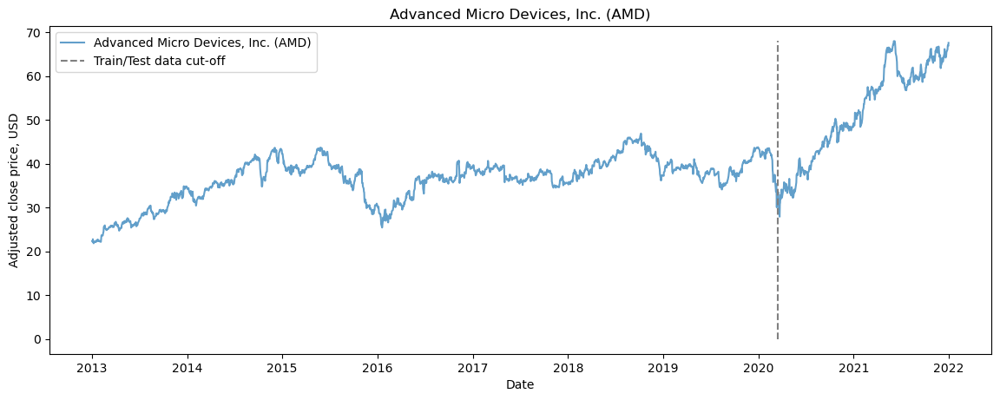

In [76]:
plt.figure(figsize=(14, 5), dpi=100)
plt.plot(stock_df['Date'], stock_df['Adj Close'], label='Advanced Micro Devices, Inc. (AMD)', alpha = 0.7)
plt.vlines(datetime.date(year,month, day), 0, stock_df['Adj Close'].max(), linestyles='--', colors='gray', label='Train/Test data cut-off')
plt.xlabel('Date')
plt.ylabel('Adjusted close price, USD')
plt.title('Advanced Micro Devices, Inc. (AMD)')
plt.legend()
plt.show()

In [77]:
stock_df.describe().T

,count,mean,std,min,25%,50%,75%,max
^GSPC,2267.0,2592.580396,781.401906,1457.150024,2020.714966,2432.459961,2935.729981,4793.060059
^DJI,2267.0,22382.318566,5996.247598,13328.849610,17323.235355,21328.470700,26327.334960,36488.628910
^IXIC,2267.0,7115.422644,3284.071455,3091.810059,4727.080079,6234.410156,8118.175049,16057.440430
^NYA,2267.0,11933.662107,1996.464400,8604.379883,10515.500000,11514.400390,12884.955075,17310.509770
^VIX,2267.0,17.000362,7.122941,9.140000,12.840000,14.910000,18.884999,82.690002
...,...,...,...,...,...,...,...,...
ma_21,2267.0,39.311356,8.816601,21.318135,35.368502,38.140797,41.428484,66.493859
rsi,2267.0,53.290940,11.930419,17.612542,45.903844,53.423725,61.844047,84.127210
macd,2267.0,0.134935,0.623812,-2.827387,-0.141153,0.166226,0.509713,2.376329
bolu,2267.0,46.452590,7.763514,28.276532,42.368106,45.193994,49.467290,71.070118


In [78]:
corr = stock_df.corr()
corr.style.background_gradient(cmap='coolwarm')

In [79]:
def plot_technical_indicators(dataset, last_days):
    plt.figure(figsize=(16, 10), dpi=100)
    shape_0 = dataset.shape[0]
    xmacd_ = shape_0-last_days
    
    dataset = dataset.iloc[-last_days:, :]
    x_ = range(3, dataset.shape[0])
    x_ =list(dataset.index)
    
    # Plot first subplot
    plt.subplot(3, 1, 1)
    plt.plot(dataset['ma_7'],label='MA 7', color='g',linestyle='--')
    plt.plot(dataset['ma_21'],label='MA 21', color='r',linestyle='--')
    plt.plot(dataset['Adj Close'],label='Adj Close', color='b')
    plt.plot(dataset['bolu'],label='Bollinger Upper Band', color='c')
    plt.plot(dataset['bold'],label='Bollinger Lower Band', color='c')
    plt.fill_between(x_, dataset['bolu'], dataset['bold'], alpha=0.35)
    plt.title('Technical indicators for Advanced Micro Devices, Inc. (AMD) - last {} days.'.format(last_days))
    plt.ylabel('Adjusted close price, USD')
    plt.legend()

    # Plot second subplot
    plt.subplot(3, 1, 2)
    plt.title('MACD')
    plt.plot(dataset['macd'],label='MACD', linestyle='-.')
    plt.hlines(5, xmacd_, shape_0, colors='g', linestyles='--')
    plt.hlines(-5, xmacd_, shape_0, colors='g', linestyles='--')
    plt.legend()
    
    plt.subplot(3, 1, 3)
    plt.title('RSI')
    plt.plot(dataset['rsi'],label='RSI', color='b',linestyle='-')
    plt.legend()
    
    plt.show()

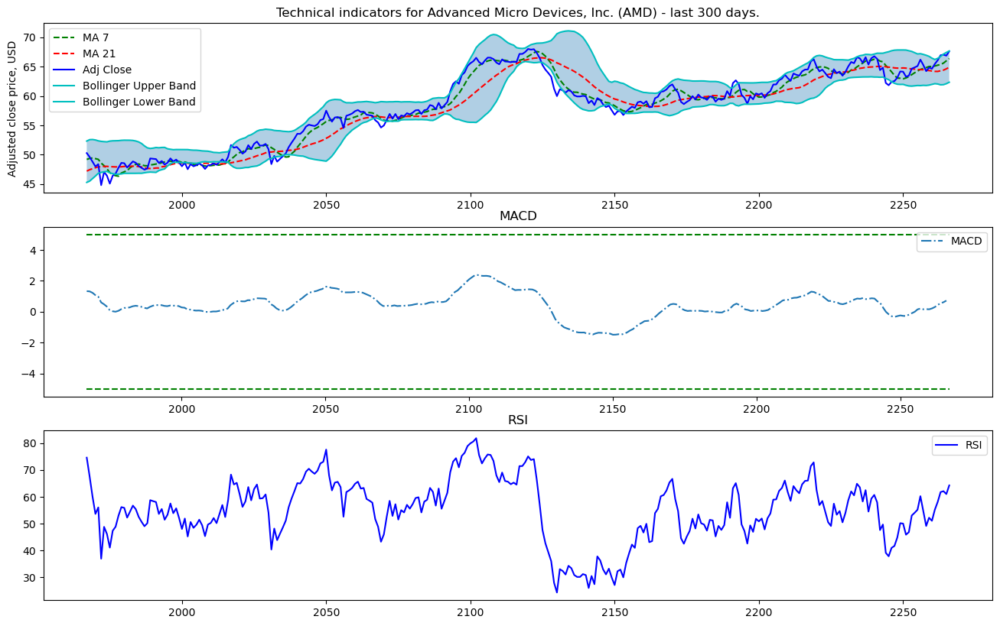

In [80]:
plot_technical_indicators(stock_df, 300)

In [81]:
def statistic(df, param):
    df = ct.add_constant(df)
    ivar = ["const"] + param
    reg = rg.OLS(df["Adj Close"], df[ivar], hasconst=bool).fit()
    res = reg.resid
    dw = durbin_watson(res)
    bplmt_statistic = np.round(dg.het_breuschpagan(res, exog_het = df[ivar])[0], 6)
    bplmt_p_value = np.round(dg.het_breuschpagan(res, exog_het = df[ivar])[1], 6)

    return bplmt_statistic, bplmt_p_value, dw, df[ivar]

In [82]:
parameters = []
for el in stock_df.columns.tolist():
    if el != "Adj Close" and el != 'Date':
        parameters.append([el])



In [84]:
#https://www.youtube.com/watch?v=jy2OurbLFGg
#https://stats.stackexchange.com/questions/239060/interpretation-of-breusch-pagan-test-bptest-in-r/239062
#https://www.statsmodels.org/dev/_modules/statsmodels/stats/diagnostic.html#het_breuschpagan
# https://www.statsmodels.org/stable/_modules/statsmodels/stats/stattools.html#durbin_watson
# https://www.statology.org/durbin-watson-test-python/
param =  (parameters)
pairplot_list = []

for el in param:   
    col_names = ["Adj Close"] + el
    data_for_test = stock_df[col_names]
    bp_statistic = statistic(data_for_test, el)[0]
    bp_pvalue = statistic(data_for_test, el)[1]
    dw = statistic(data_for_test, el)[2]
    if bp_pvalue>=0.05:# and (dw >= 1 and dw >= 3)
        pairplot_list.append(el[0])
        print("--------------------")
        print(f"Heteroskedastic analysis for {el}")
        print()
        print(f"Breusch-Pagan LM test statistic", statistic(data_for_test, el)[0])
        print("Breusch-Pagan LM test P-Value: ", statistic(data_for_test, el)[1])
        print("durbin_watson: ", statistic(data_for_test, el)[2]) 
        print()


--------------------
Heteroskedastic analysis for ['EURUSD=X']

Breusch-Pagan LM test statistic 1.640221
Breusch-Pagan LM test P-Value:  0.200295
durbin_watson:  0.004696194517420424

--------------------
Heteroskedastic analysis for ['GBPUSD=X']

Breusch-Pagan LM test statistic 2.719749
Breusch-Pagan LM test P-Value:  0.099114
durbin_watson:  0.005100674333547253

--------------------
Heteroskedastic analysis for ['JLCYX']

Breusch-Pagan LM test statistic 1.972508
Breusch-Pagan LM test P-Value:  0.160182
durbin_watson:  0.015934197922661864

--------------------
Heteroskedastic analysis for ['CNPIX']

Breusch-Pagan LM test statistic 2.798797
Breusch-Pagan LM test P-Value:  0.094335
durbin_watson:  0.016905707828708313

--------------------
Heteroskedastic analysis for ['OAKMX']

Breusch-Pagan LM test statistic 3.259802
Breusch-Pagan LM test P-Value:  0.070998
durbin_watson:  0.015773387052156078

--------------------
Heteroskedastic analysis for ['BPTRX']

Breusch-Pagan LM test statis

In [85]:
pairplot_list

['EURUSD=X',
 'GBPUSD=X',
 'JLCYX',
 'CNPIX',
 'OAKMX',
 'BPTRX',
 'UOPIX',
 'RYVLX',
 'ACN',
 'WFC',
 'T',
 'LOW']

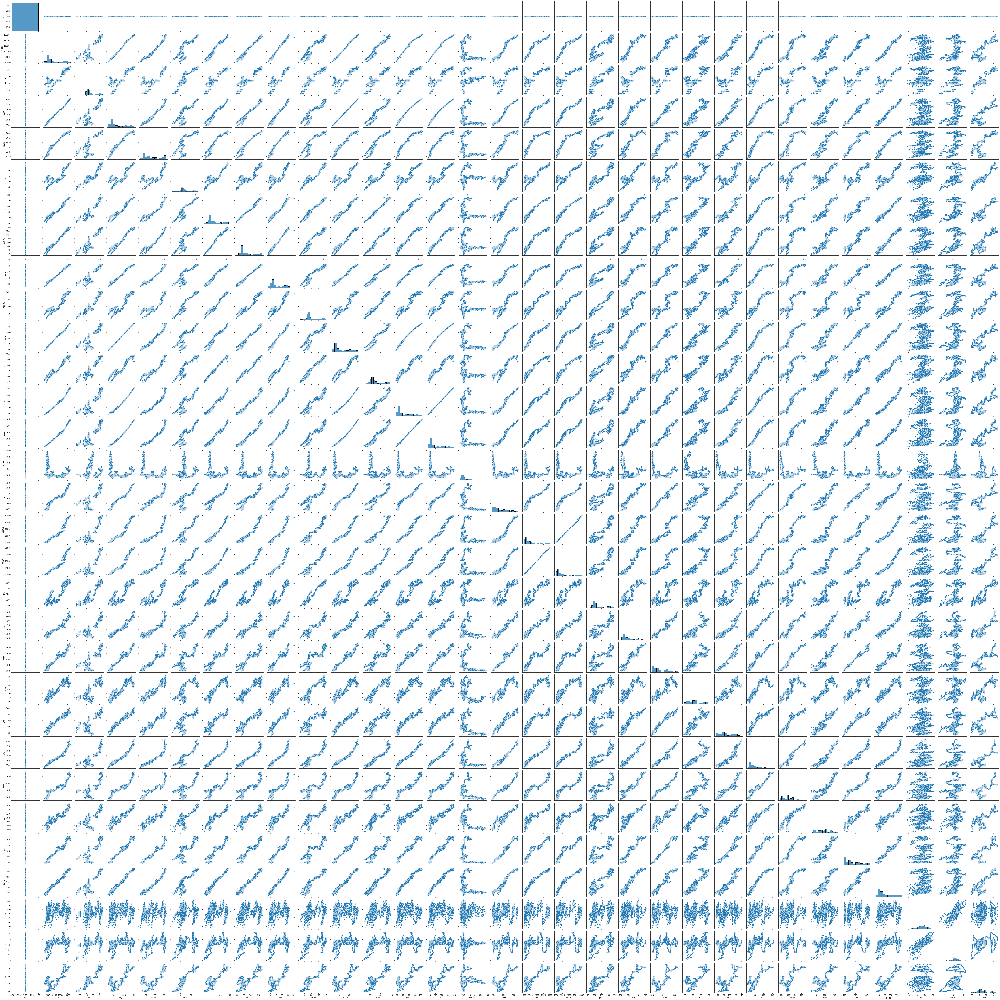

In [130]:
# col_names = ["Adj Close"] + pairplot_list
# data_for_test = stock_df[col_names]
# sns.pairplot(statistic(data_for_test, pairplot_list)[3])


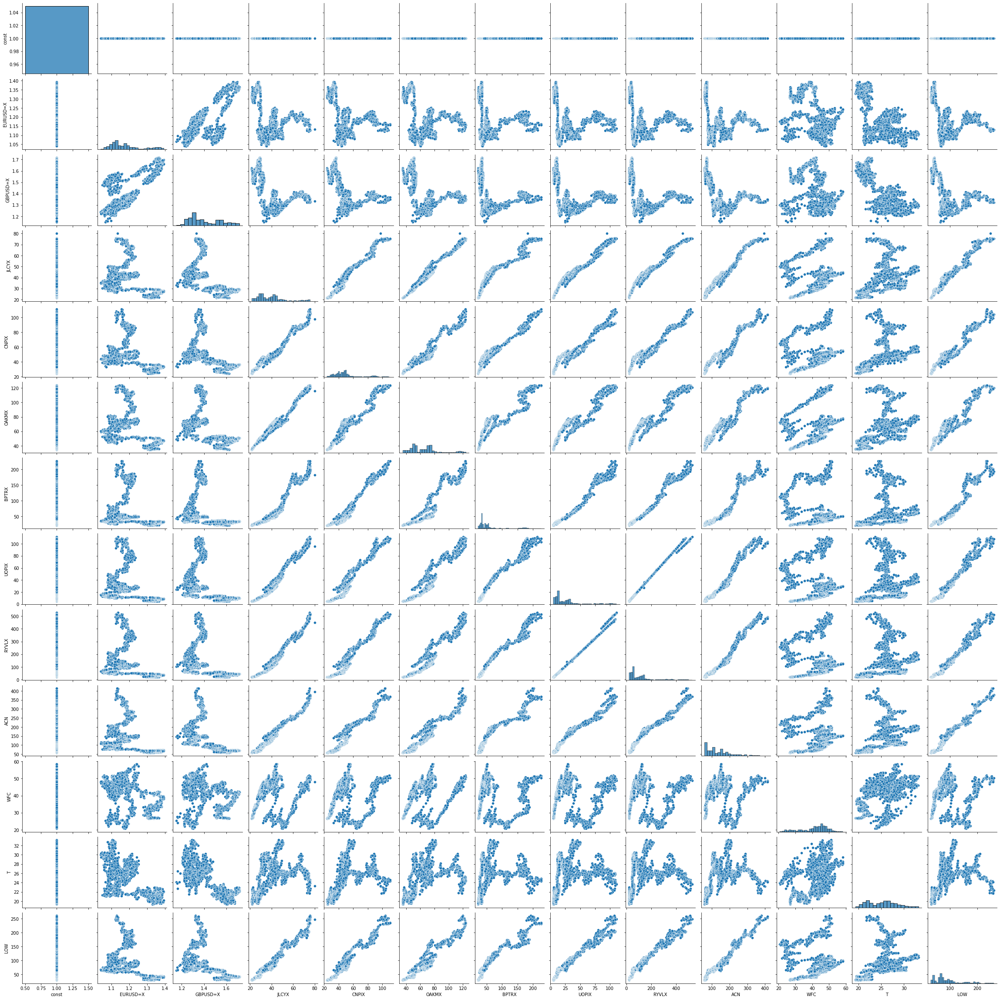

In [87]:
col_names = ["Adj Close"] + pairplot_list
data_for_test = stock_df[col_names]
sns.pairplot(statistic(data_for_test, pairplot_list)[3])

In [33]:
# ARIMA as feature
# series = stock_df["Adj Close"]
# model = sm.tsa.arima.ARIMA(series, order=(5, 1, 0))
# model_fit = model.fit()
# print(model_fit.summary())

In [88]:
print('Total dataset has {} samples, and {} features.'.format(stock_df.shape[0], \
                                                              stock_df.shape[1]))

Total dataset has 2267 samples, and 98 features.


In [124]:
def get_feature_importance_data(df):
    data = df.copy()
    y = data['Adj Close']
    data = data.drop('Adj Close', axis=1)
    X = data.iloc[:, 1:]
#     X = (X - X.min ()) / (X.max () - X.min ())
   
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

In [104]:
# data = stock_df.copy()
# data.iloc[:, :]

In [125]:
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(stock_df)

In [126]:
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=150,base_score=0.7,colsample_bytree=1,learning_rate=0.05)

In [127]:
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)

In [128]:
eval_result = regressor.evals_result()

In [129]:
training_rounds = range(len(eval_result['validation_0']['rmse']))

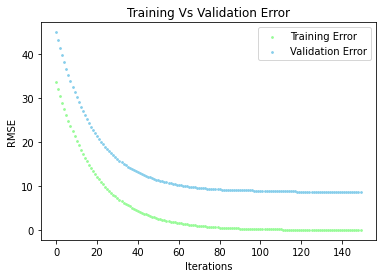

In [130]:
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error', color = "palegreen", s=3)
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error', color = "skyblue", s=3)
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('Training Vs Validation Error')
plt.legend()
plt.show()
# Данните са много малко и модела няма достатъчно капацитет. 0,65  0,75  0,8 0,82 0,83  0,85  0.9  0.95--->train_samples

In [265]:
# lst = xgbModel.feature_importances_.tolist()
# [lst[i] for i in range(0,len(lst)) if lst[i] >= 0.005]


Text(0.5, 1.0, 'Top 30 features important')

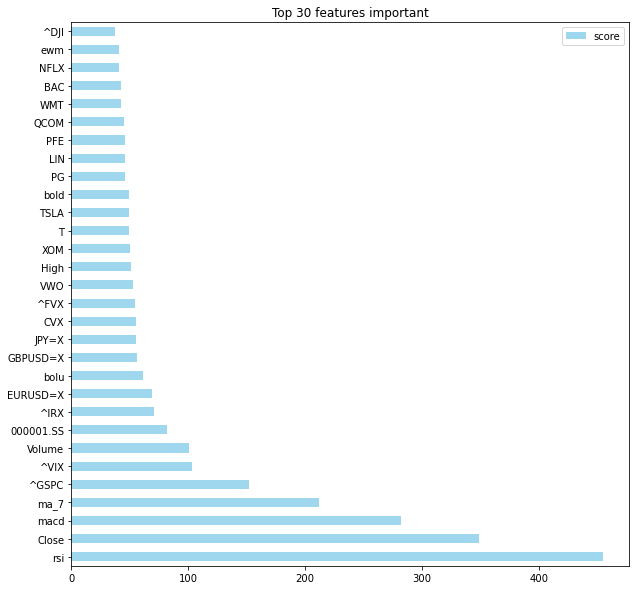

In [131]:
# https://matplotlib.org/stable/gallery/color/named_colors.html
feature_important = xgbModel.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(30, columns="score").plot(kind='barh', figsize = (10,10), color = 'skyblue', alpha = 0.8)
plt.title("Top 30 features important")
## plot top 30 features 

In [132]:
data.nlargest(30, columns="score")

,score
rsi,455.0
Close,349.0
macd,282.0
ma_7,212.0
^GSPC,152.0
^VIX,103.0
Volume,101.0
000001.SS,82.0
^IRX,71.0
EURUSD=X,69.0


In [133]:
pca_df = stock_df.drop('Adj Close', axis=1)
pca_df = stock_df.drop('Date', axis=1)
pca_df

,^GSPC,^DJI,^IXIC,^NYA,^VIX,000001.SS,EURUSD=X,JPY=X,GBPUSD=X,^IRX,...,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,1462.420044,13412.54980,3112.260010,8632.009766,14.680000,2269.127930,1.319784,86.599998,1.624695,0.055,...,28.670000,6677100.0,22.333021,21.331151,21.544037,21.318135,67.941068,0.248235,28.276532,26.462801
1,1459.369995,13391.36035,3100.570068,8607.790039,14.560000,2269.127930,1.318218,87.275002,1.625250,0.065,...,28.440001,3970700.0,22.153856,21.405942,21.617482,21.379339,64.147206,0.281482,28.441684,26.473316
2,1466.469971,13435.20996,3101.659912,8667.679688,13.830000,2276.991943,1.303271,87.739998,1.608234,0.065,...,29.219999,5842400.0,22.761450,21.529170,21.782178,21.472445,70.220351,0.352791,28.711065,26.420268
3,1461.890015,13384.29004,3098.810059,8636.910156,13.790000,2285.364014,1.306745,88.197998,1.606787,0.058,...,28.010000,8339200.0,21.818892,21.555509,21.842268,21.520295,54.731819,0.329449,28.761600,26.540400
4,1457.150024,13328.84961,3091.810059,8604.379883,13.620000,2276.070068,1.312508,87.252998,1.612201,0.060,...,28.340000,3880400.0,22.075962,21.602823,21.936858,21.580387,57.486092,0.327914,28.805516,26.614484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,4791.189941,36302.37891,15871.259770,17141.089840,17.680000,3615.969971,1.132426,114.333000,1.340430,0.043,...,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
2263,4786.350098,36398.21094,15781.719730,17134.160160,17.540001,3630.112061,1.133003,114.792000,1.344267,0.050,...,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
2264,4793.060059,36488.62891,15766.219730,17149.929690,16.950001,3597.000000,1.131478,114.773003,1.343328,0.045,...,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
2265,4778.729980,36398.07813,15741.559570,17164.240230,17.330000,3619.189941,1.136015,114.947998,1.349879,0.025,...,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [164]:
pca = PCA(n_components=.98)

In [165]:
x_pca = StandardScaler().fit_transform(pca_df)

In [166]:
principalComponents = pca.fit_transform(x_pca)

In [167]:
pca.explained_variance_ratio_

array([0.76707727, 0.0666976 , 0.05650272, 0.03153177, 0.01860046,
       0.01056067, 0.009064  , 0.00722278, 0.0060291 , 0.0048586 ,
       0.0035481 ])

In [168]:
n_pcs= pca.components_.shape[0]
initial_feature_names = pca_df.columns
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
most_important_names

['^GSPC',
 'WFC',
 '^IRX',
 'JPY=X',
 'macd',
 '^VIX',
 'Volume',
 'Volume',
 'PFE',
 '^VIX',
 '^VIX']

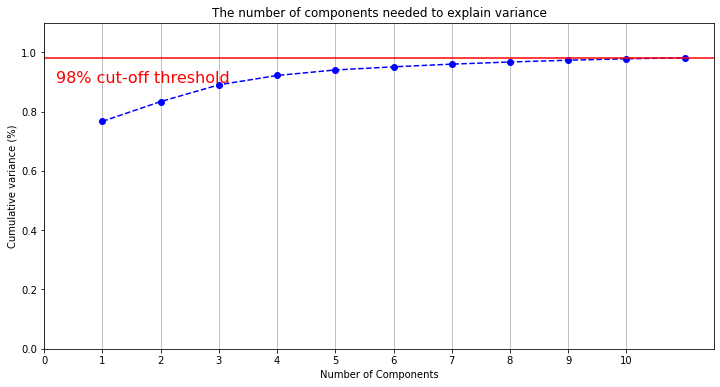

In [171]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 12, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 11, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.98, color='r', linestyle='-')
plt.text(0.2, 0.90, '98% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
# feature_importance_data XGB.Prepare 3 datasets for RNN and LSTM.

In [175]:
dataset_small = stock_df[["Date","Adj Close" ] + most_important_names]
dataset_small.to_csv(r'data\dataset_small_9.csv', index = False, header=True)
dataset_small

,Date,Adj Close,^GSPC,WFC,^IRX,JPY=X,macd,^VIX,Volume,Volume,PFE,^VIX,^VIX
0,2013-01-02,22.333021,1462.420044,26.926046,0.055,86.599998,0.248235,14.680000,6677100.0,6677100.0,17.725426,14.680000,14.680000
1,2013-01-03,22.153856,1459.369995,26.703266,0.065,87.275002,0.281482,14.560000,3970700.0,3970700.0,17.684381,14.560000,14.560000
2,2013-01-04,22.761450,1466.469971,26.841543,0.065,87.739998,0.352791,13.830000,5842400.0,5842400.0,17.759630,13.830000,13.830000
3,2013-01-07,21.818892,1461.890015,26.710939,0.058,88.197998,0.329449,13.790000,8339200.0,8339200.0,17.773319,13.790000,13.790000
4,2013-01-08,22.075962,1457.150024,26.664845,0.060,87.252998,0.327914,13.620000,3880400.0,3880400.0,17.800684,13.620000,13.620000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,66.070000,4791.189941,48.770000,0.043,114.333000,0.302337,17.680000,1175900.0,1175900.0,59.200001,17.680000,17.680000
2263,2021-12-28,66.930000,4786.350098,48.419998,0.050,114.792000,0.438992,17.540001,1049900.0,1049900.0,58.009998,17.540001,17.540001
2264,2021-12-29,67.010002,4793.060059,48.450001,0.045,114.773003,0.547438,16.950001,1038500.0,1038500.0,57.580002,16.950001,16.950001
2265,2021-12-30,66.860001,4778.729980,48.099998,0.025,114.947998,0.614197,17.330000,906900.0,906900.0,58.400002,17.330000,17.330000


In [176]:
dataset_big = stock_df[["Date","Adj Close" ] + list(data.nlargest(30, columns="score").index)]
dataset_big.to_csv(r'data\dataset_big_9.csv', index = False, header=True)
dataset_big

,Date,Adj Close,rsi,Close,macd,ma_7,^GSPC,^VIX,Volume,000001.SS,...,bold,PG,LIN,PFE,QCOM,WMT,BAC,NFLX,ewm,^DJI
0,2013-01-02,22.333021,67.941068,28.670000,0.248235,21.544037,1462.420044,14.680000,6677100.0,2269.127930,...,26.462801,52.756119,93.433762,17.725426,50.161076,56.032291,10.460158,13.144286,21.331151,13412.54980
1,2013-01-03,22.153856,64.147206,28.440001,0.281482,21.617482,1459.369995,14.560000,3970700.0,2269.127930,...,26.473316,52.421600,93.433762,17.684381,49.928661,55.676220,10.399290,13.798571,21.405942,13391.36035
2,2013-01-04,22.761450,70.220351,29.219999,0.352791,21.782178,1466.469971,13.830000,5842400.0,2276.991943,...,26.420268,52.528057,94.064522,17.759630,49.192722,55.886623,10.529717,13.711429,21.529170,13435.20996
3,2013-01-07,21.818892,54.731819,28.010000,0.329449,21.842268,1461.890015,13.790000,8339200.0,2285.364014,...,26.540400,52.170712,93.857025,17.773319,49.587811,55.352516,10.512328,14.171429,21.555509,13384.29004
4,2013-01-08,22.075962,57.486092,28.340000,0.327914,21.936858,1457.150024,13.620000,3880400.0,2276.070068,...,26.614484,52.087082,94.512688,17.800684,49.510326,55.506275,10.416681,13.880000,21.602823,13328.84961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,66.070000,58.105626,66.070000,0.302337,65.231429,4791.189941,17.680000,1175900.0,3615.969971,...,62.033441,161.100357,343.420013,59.200001,186.330002,140.759995,44.639999,613.119995,64.719121,36302.37891
2263,2021-12-28,66.930000,61.772180,66.930000,0.438992,65.340001,4786.350098,17.540001,1049900.0,3630.112061,...,61.891113,161.965683,343.790008,58.009998,184.820007,142.779999,44.700001,610.710022,64.920110,36398.21094
2264,2021-12-29,67.010002,62.104439,67.010002,0.547438,65.588573,4793.060059,16.950001,1038500.0,3597.000000,...,61.917051,163.308441,345.399994,57.580002,186.199997,142.710007,44.630001,610.539978,65.110100,36488.62891
2265,2021-12-30,66.860001,61.033303,66.860001,0.614197,65.965716,4778.729980,17.330000,906900.0,3619.189941,...,62.084962,161.896072,344.329987,58.400002,182.729996,143.169998,44.529999,612.090027,65.269182,36398.07813


In [177]:
# Breusch-Pagan LM test P-Value:  >=0.5

dataset_breusch_pagan_test = stock_df[["Date","Adj Close" ] + pairplot_list]
dataset_breusch_pagan_test.to_csv(r'data\dataset_breusch_pagan_test_9.csv', index = False, header=True)
dataset_breusch_pagan_test

,Date,Adj Close,EURUSD=X,GBPUSD=X,JLCYX,CNPIX,OAKMX,BPTRX,UOPIX,RYVLX,ACN,WFC,T,LOW
0,2013-01-02,22.333021,1.319784,1.624695,21.546637,24.165928,35.002926,22.064262,5.194909,22.180546,57.524582,26.926046,20.130396,30.915403
1,2013-01-03,22.153856,1.318218,1.625250,21.517818,24.142529,34.911549,22.159204,5.141466,21.948225,57.316322,26.703266,20.141891,30.624966
2,2013-01-04,22.761450,1.303271,1.608234,21.654692,24.306316,35.094296,22.358580,5.108578,21.817141,57.632862,26.841543,20.262678,30.394314
3,2013-01-07,21.818892,1.306745,1.606787,21.597061,24.091055,34.988865,22.235155,5.109976,21.814545,57.382957,26.710939,20.354708,29.693823
4,2013-01-08,22.075962,1.312508,1.612201,21.546637,24.048935,34.911549,22.149710,5.089421,21.726290,57.716152,26.664845,20.010992,29.710911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,2021-12-27,66.070000,1.132426,1.340430,75.349998,103.540001,119.839996,202.779999,103.930000,494.809998,414.255981,48.770000,24.286488,252.866135
2263,2021-12-28,66.930000,1.133003,1.344267,75.320000,103.669998,119.860001,202.089996,102.940002,490.130005,414.196137,48.419998,24.325691,253.185089
2264,2021-12-29,67.010002,1.131478,1.343328,75.330002,104.160004,119.839996,202.089996,102.949997,490.200012,414.345795,48.450001,24.149275,256.723419
2265,2021-12-30,66.860001,1.136015,1.349879,75.220001,103.510002,119.489998,200.660004,102.209999,486.529999,412.759857,48.099998,24.286488,255.547317
